# Abundance Clusters

In [1]:
# This must be run inside docker contianers to have interactive visualziation
! export MPL_BACKEND=TkAgg

In [68]:
# server
# local_dir = '/root/host_home/luca'

# local
local_dir = '/root/host_home/sc-luca-explore'

import os
os.chdir(local_dir)

import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')
import matplotlib.pyplot as plt
import pandas as pd

from utils import abundance

In [69]:
backup_dir = '/root/datos/maestria/netopaas/luca_explore/surgeries/'
atlas_dir = '/root/datos/maestria/netopaas/luca/data/atlas/'
meta_folder = f'{local_dir}/metadata/'
output_dir = 'nb_graphAnalysis/output/'
# The atlas with only tumor primary tissues and uicc stage annotated

cell_type_key = 'cell_type_adjusted'
sample_key = 'sample'
dataset_key = 'dataset'

## I-II Leiden Wu

Get the relative abundance of cell type per sample.
NECCESARY IMPORTS

In [70]:
time = 'I-II_leidenwu_funcnames'
time_solo = time.split('_')[0]
time_suffix = 'early' if time_solo == 'I-II' else 'late'
category_map = abundance.cell_category_mapping

# Unstack the group counts
groups = pd.read_csv(f'{meta_folder}/groups_{time}.csv', index_col=0)
groups.sort_values([cell_type_key, sample_key])
groups.set_index([cell_type_key,sample_key], inplace=True)
cutoff = groups.loc[:, '0']
# We dont remove the cutoff because it messes with the dims
cutoff = pd.DataFrame(cutoff[cutoff > 1])
samp_type = cutoff.unstack().transpose()

# Normalize the counts
samp_type = samp_type.fillna(0)
corr_types = (samp_type.T / samp_type.T.sum()).T

groups.reset_index(inplace=True)
group_dataset = groups.groupby(['sample','dataset']).sum()
group_dataset.reset_index(inplace=True)
corr_types = pd.merge(corr_types, group_dataset.loc[:,[sample_key,'dataset']], how='left', left_on=sample_key, right_on=sample_key)
corr_types.set_index(sample_key, inplace=True)


print(f'Size of Corr_types: {corr_types.shape}')

Size of Corr_types: (122, 51)


Import CLUSTERS  if they exist if not error

In [5]:
if not 'membership' in corr_types.columns:
    df_short = pd.read_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv', index_col=0)
    corr_types = pd.merge(corr_types, df_short['membership'], how='left', right_index=True, left_index=True)
else:
    print('Memberhsip column is already present, delete it if you want to reimport')

# This is important for all later visualizations
unique_clusters = corr_types["membership"].unique()

corr_types

,B cell,B cell dividing,Ciliated,Club_AT2/1_high,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor OxPhos_Prolif,Tumor Secretory_LUAD,Tumor TTF1+_Quiescent,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
Chen_Zhang_2020_NSCLC-1,0.425497,0.000000,0.000000,0.001656,0.000000,0.009382,0.044150,0.000000,0.049669,0.000000,...,0.000000,0.002759,0.000000,0.002208,0.003863,0.000000,0.002759,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-11,0.019734,0.000000,0.001845,0.000321,0.000562,0.000000,0.000000,0.000321,0.012033,0.000160,...,0.000000,0.008824,0.000000,0.000241,0.003209,0.000562,0.000963,0.0,Chen_Zhang_2020,1
Chen_Zhang_2020_NSCLC-2,0.142195,0.000000,0.000000,0.000000,0.001030,0.000000,0.000000,0.001546,0.012880,0.010046,...,0.000000,0.004122,0.000000,0.003091,0.011592,0.000773,0.001803,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-3,0.107605,0.000000,0.000695,0.000000,0.000695,0.000000,0.000000,0.000000,0.004032,0.002502,...,0.000000,0.000695,0.000000,0.002085,0.003476,0.000278,0.004866,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-6,0.011220,0.000000,0.003866,0.000943,0.000849,0.000377,0.005940,0.000660,0.011786,0.000471,...,0.000189,0.022534,0.000849,0.002734,0.056195,0.012729,0.000849,0.0,Chen_Zhang_2020,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p4t1,0.039377,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001832,0.000000,...,0.035714,0.000000,0.000000,0.002747,0.021062,0.002747,0.007326,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p4t2,0.028770,0.000000,0.000000,0.000000,0.004960,0.000000,0.000000,0.000000,0.002976,0.000000,...,0.038690,0.003968,0.001984,0.000000,0.031746,0.001984,0.013889,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p4t3,0.026211,0.000000,0.000000,0.000000,0.001589,0.000000,0.000000,0.000000,0.001589,0.000000,...,0.033360,0.001589,0.003177,0.001589,0.030183,0.001589,0.006354,0.0,Zilionis_Klein_2019,0


IMPORT GRAPHS IF EXIST

In [20]:
import pickle
import os

Gs_E = {}
for fname in os.listdir(output_dir):
    if fname.startswith(f"G_{time_solo}_") and fname.endswith(".pkl"):
        cluster_id = fname[len(f"G_{time_solo}_"):-4]
        with open(os.path.join(output_dir, fname), "rb") as f:
            Gs_E[int(cluster_id)] = pickle.load(f)

Gs = Gs_E
Gs

{1: <networkx.classes.graph.Graph at 0x7f4730e3f750>,
 2: <networkx.classes.graph.Graph at 0x7f472faa9590>,
 4: <networkx.classes.graph.Graph at 0x7f47266c9590>,
 3: <networkx.classes.graph.Graph at 0x7f472fbba550>,
 0: <networkx.classes.graph.Graph at 0x7f4727625090>}

### Box plot general

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")


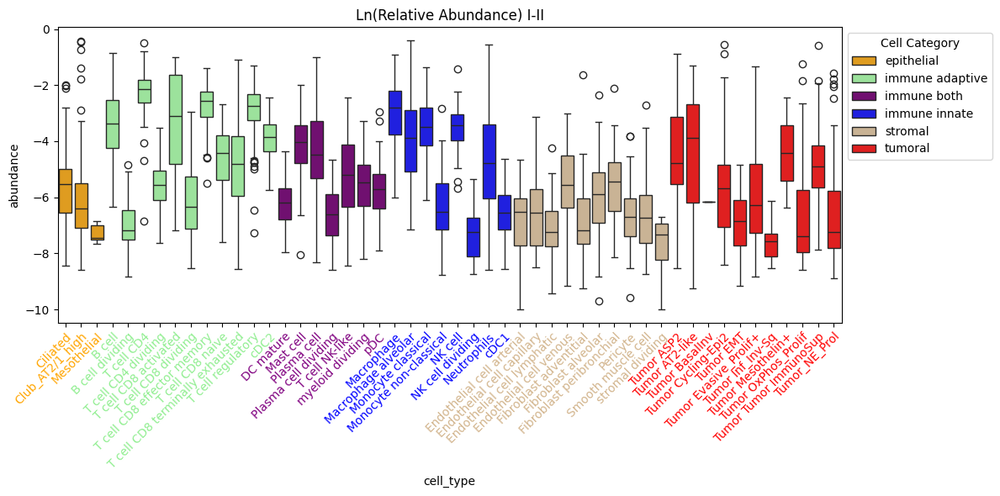

In [72]:
abundance.plot_celltype_boxplot(corr_types.drop(columns=['dataset',
                                                        #  'membership'
                                                         ]), time_solo,
                                 abundance.cell_category_mapping, abundance.color_map)

#### Immune

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_ho

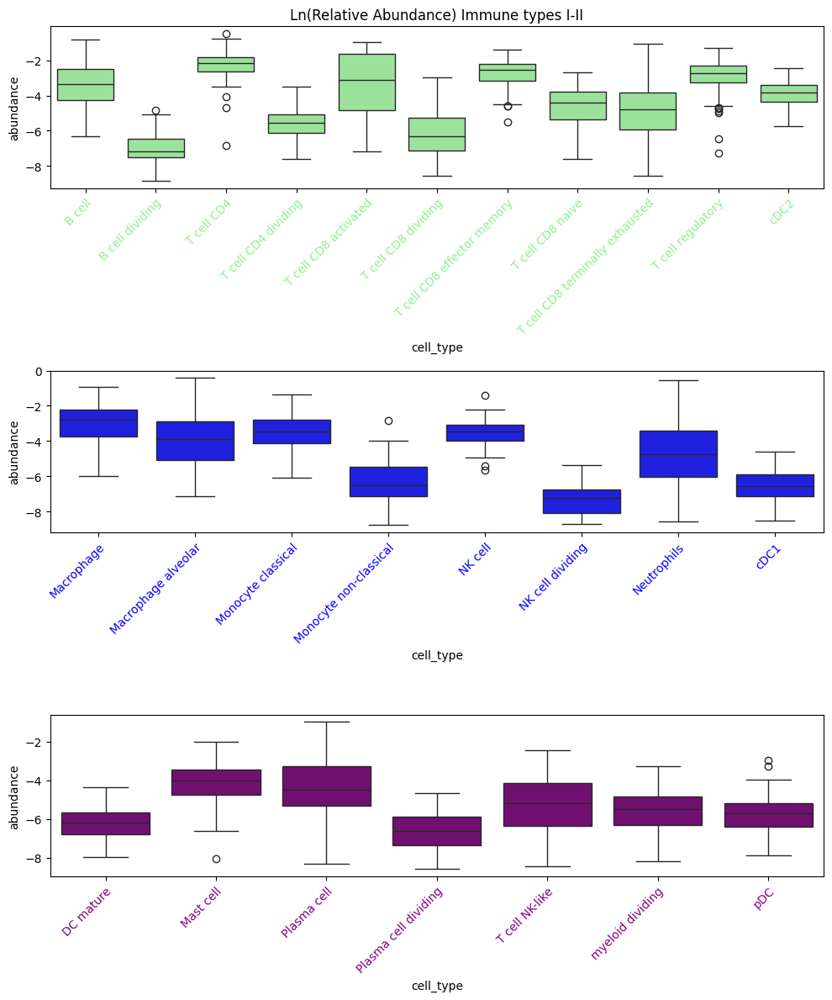

In [73]:
cats_of_interest = ['immune adaptive',
                     'immune innate', 'immune both'
                     ]

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    # ax.tick_params(axis='x', labelcolor='black')
    # ax.set_xticklabels([])
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

#### Stromal

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_ho

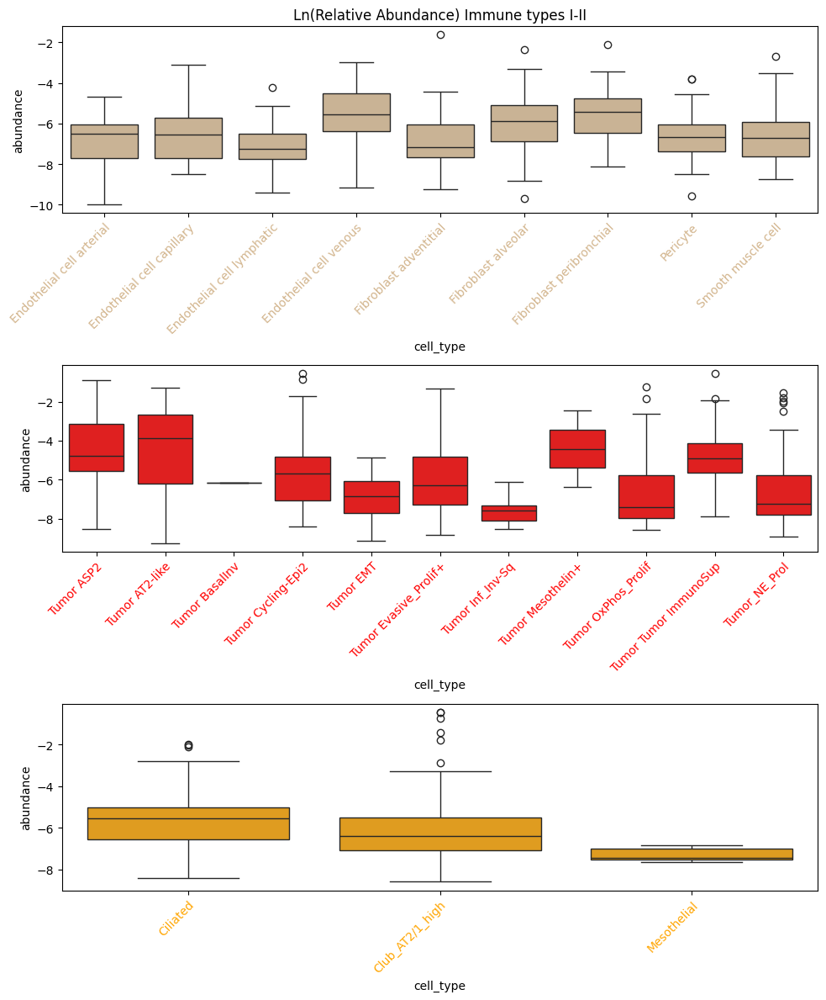

In [74]:
cats_of_interest = ['stromal', 'tumoral', 'epithelial']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

### Calculate clusters

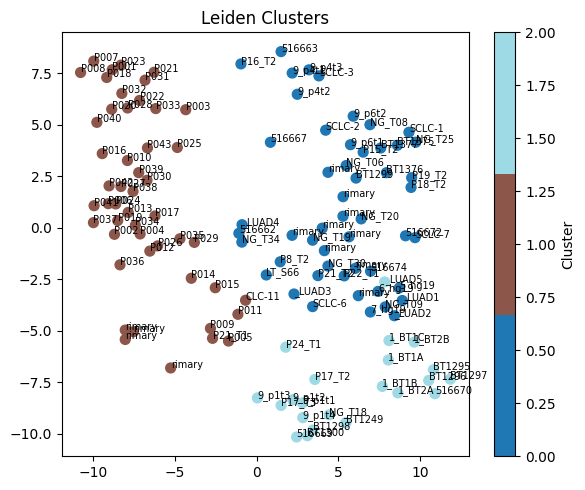

,B cell,B cell dividing,Ciliated,Club_AT2/1_high,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor OxPhos_Prolif,Tumor Tumor ImmunoSup,Tumor_NE_Prol,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
Chen_Zhang_2020_NSCLC-1,0.425497,0.0,0.000000,0.001656,0.000000,0.009382,0.04415,0.000000,0.049669,0.000000,...,0.000000,0.002759,0.000000,0.002208,0.003863,0.000000,0.002759,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-11,0.019734,0.0,0.001845,0.000321,0.000562,0.000000,0.00000,0.000321,0.012033,0.000160,...,0.000000,0.008824,0.008503,0.000241,0.003209,0.000562,0.000963,0.0,Chen_Zhang_2020,1
Chen_Zhang_2020_NSCLC-2,0.142195,0.0,0.000000,0.000000,0.001030,0.000000,0.00000,0.001546,0.012880,0.010046,...,0.000000,0.004122,0.000000,0.003091,0.011592,0.000773,0.001803,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-3,0.107605,0.0,0.000695,0.000000,0.000695,0.000000,0.00000,0.000000,0.004032,0.002502,...,0.000000,0.000695,0.000000,0.002085,0.003476,0.000278,0.004866,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-6,0.011220,0.0,0.003866,0.000943,0.000849,0.000377,0.00594,0.000660,0.011786,0.000471,...,0.000189,0.022534,0.000471,0.002734,0.056195,0.012729,0.000849,0.0,Chen_Zhang_2020,0


In [ ]:
g = abundance.cluster_samples_leiden(corr_types.drop(columns=['dataset','membership']), k=4, res=0.2)

# Create a mapping from sample name to membership
membership_map = {v["name"]: v["membership"] for v in g.vs}

# Add the membership column to corr_types_III
corr_types["membership"] = corr_types.index.map(membership_map)
unique_clusters = corr_types["membership"].unique()
corr_types.head()

In [92]:
df_short = corr_types[['dataset', 'membership']].sort_values('membership')
df_short.to_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv')
df_short

,dataset,membership
sample,,
Chen_Zhang_2020_NSCLC-1,Chen_Zhang_2020,0
Lambrechts_Thienpont_2018_6653_scrBT1425_hg19,Lambrechts_Thienpont_2018_6653,0
Lambrechts_Thienpont_2018_6653_scrBT1426_hg19,Lambrechts_Thienpont_2018_6653,0
Lambrechts_Thienpont_2018_6653_scrBT1427_hg19,Lambrechts_Thienpont_2018_6653,0
Laughney_Massague_2020_GSM3516662,Laughney_Massague_2020,0
...,...,...
P17_T3,Zuani,2
P17_T2,Zuani,2
Lambrechts_Thienpont_2018_6149v1_BT1249,Lambrechts_Thienpont_2018_6149v1,2


### Abundance Heatmap

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


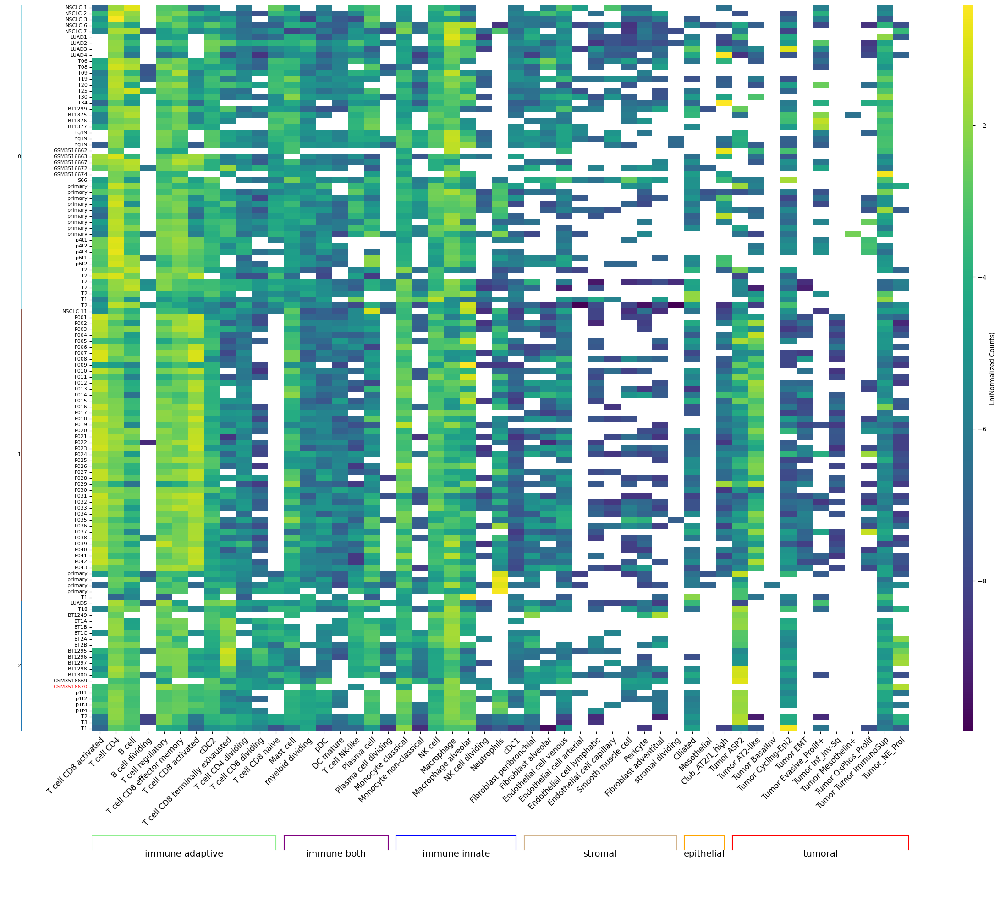

In [96]:
a = abundance.plot_abundance_heatmap(corr_types, show_plot=False, group_by_membership=True)
# a = abundance.plot_abundance_heatmap(corr_types.drop(columns='membership'), show_plot=False, group_by_membership=True)

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


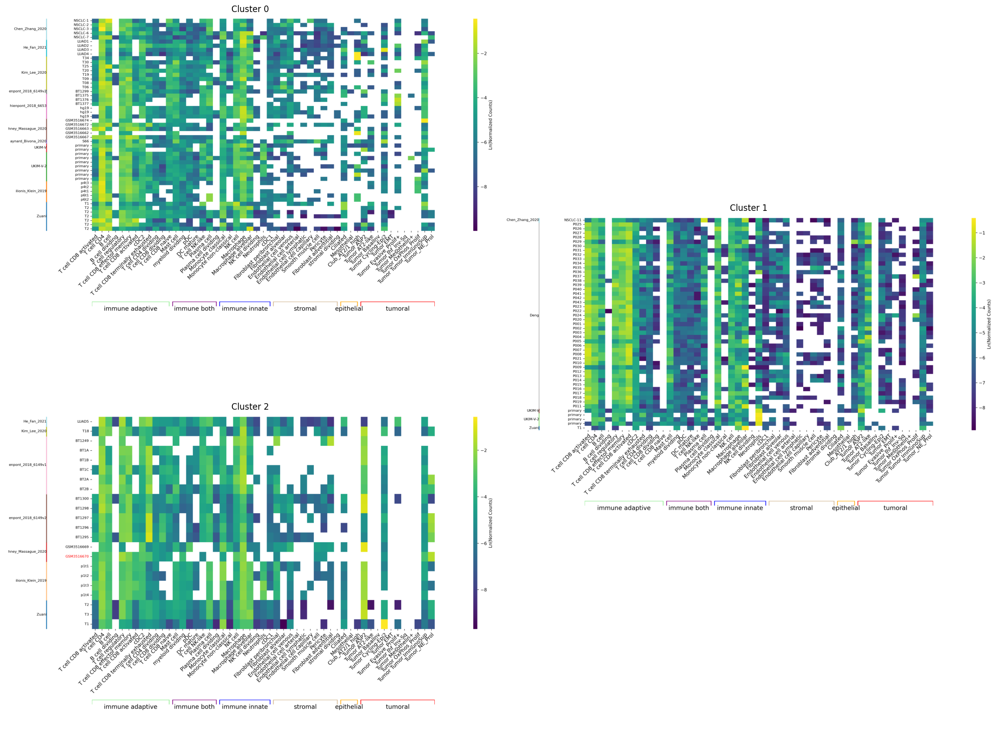

In [97]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Initialize main figure and grid
unique_clusters = sorted(c for c in corr_types["membership"].unique() if pd.notna(c))
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 8 * nrows))  # Main figure

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    if subset.empty:
        continue

    # Generate heatmap figure with lighter footprint
    temp_fig = abundance.plot_abundance_heatmap(
        subset,
        show_plot=False,
        figsize=(16, 10),
    )

    buf = io.BytesIO()
    temp_fig.savefig(buf, format="png", bbox_inches="tight", dpi=200)
    plt.close(temp_fig)  # Close temporary figure early to free memory

    buf.seek(0)
    with Image.open(buf) as img:
        img_array = np.array(img)
    buf.close()

    # Switch back to main figure explicitly
    plt.figure(fig.number)

    # Add subplot to main figure
    rs = 2 if (is_unpair and i == len(unique_clusters) - 2) else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)
    ax.imshow(img_array)
    ax.axis("off")  # Hide main figure's axes (use image's baked-in axes)
    ax.set_title(f"Cluster {cluster_id}")

plt.tight_layout()
plt.show()

### Cluster boxplots

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.

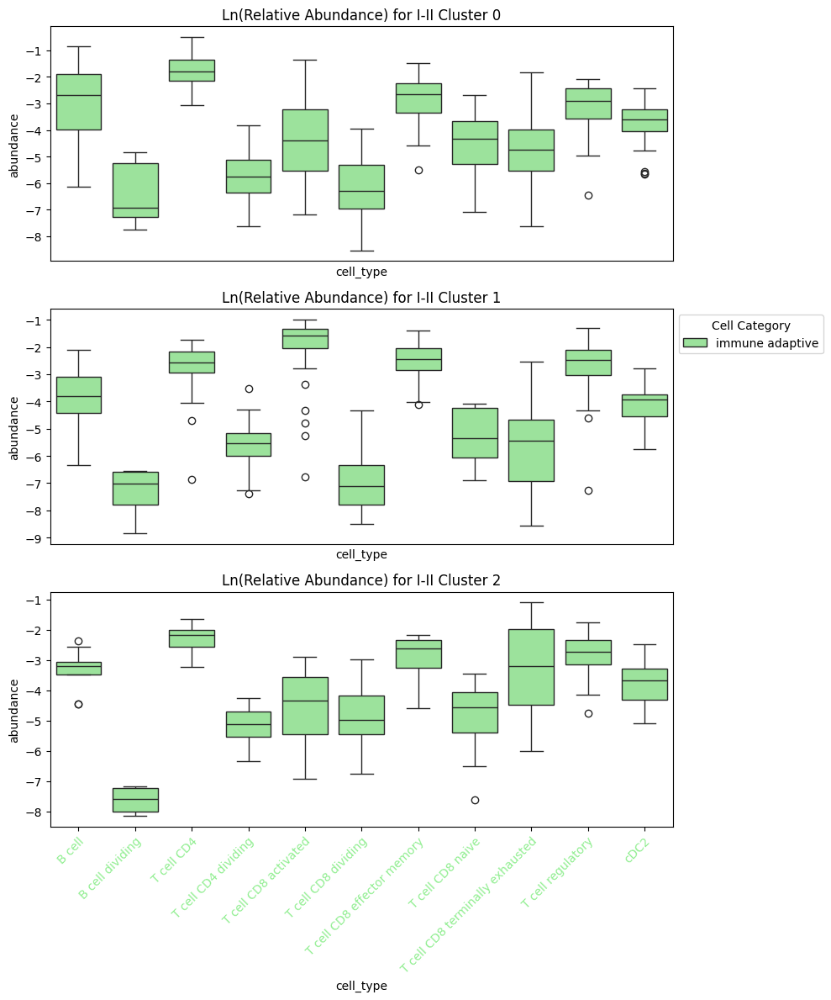

In [99]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(10, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if category_map(col) == 'immune adaptive' ]
    subset = subset[cols]    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset, title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax, xlabel_color='black')
    
    if i != 1:
        ax.get_legend().remove()

    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])


plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

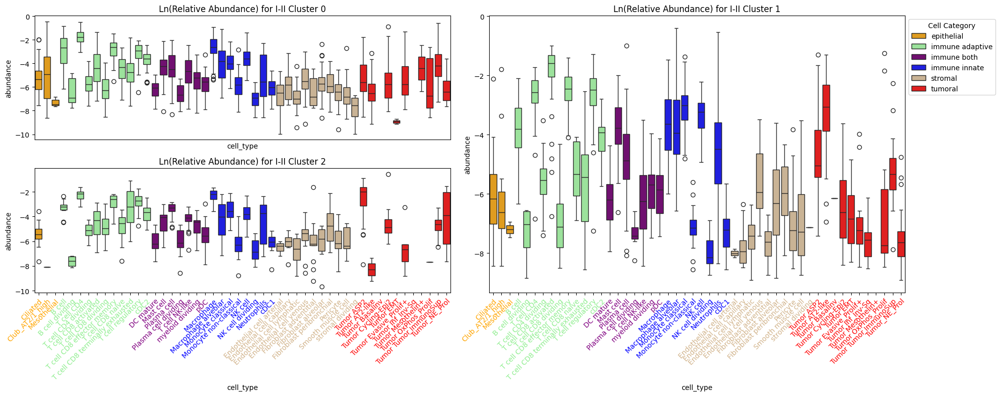

In [100]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
nrows2 = nrows -1 if is_unpair else nrows
fig = plt.figure(figsize=(20, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset.drop(columns=['dataset']),title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax)
    
    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])        
        
    if i != 1:
        ax.get_legend().remove()


plt.tight_layout()
plt.show()

### Coabundance GRAPHS

In [17]:
Gs = {}

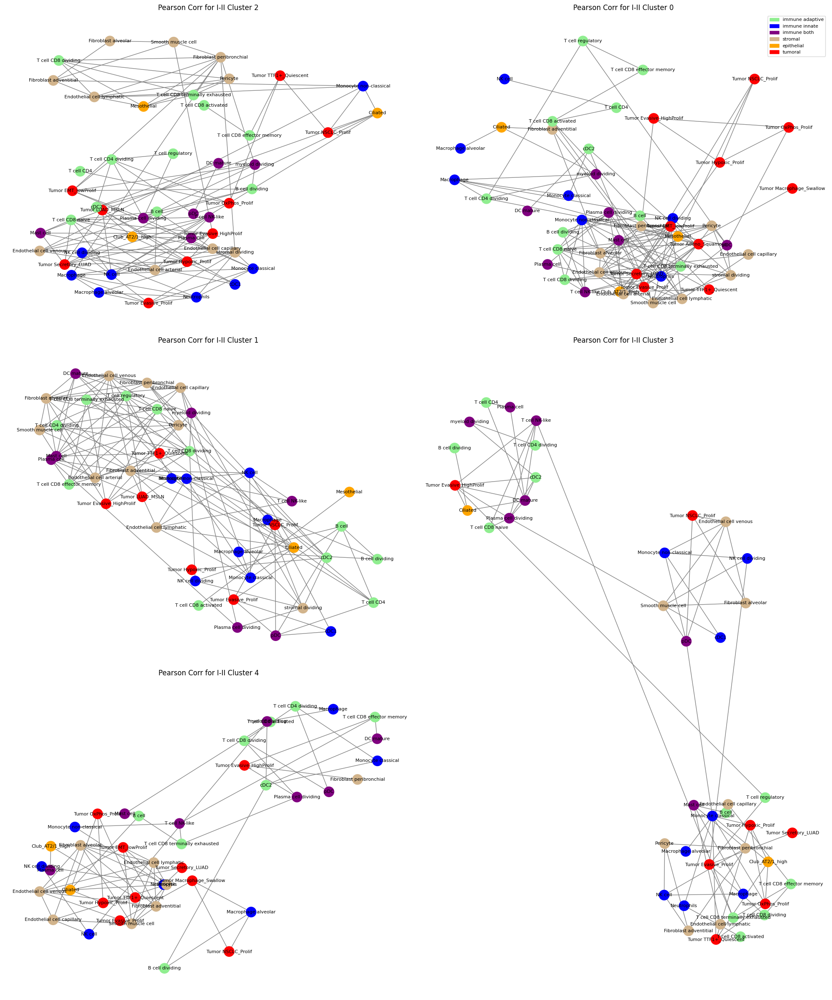

In [30]:
unique_clusters = corr_types["membership"].unique()
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(20, 8*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id]#.drop(columns="membership")

    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    
    abundance.draw_graph(G, ax, f'Pearson Corr for {time_solo} Cluster {cluster_id}', scale2=7)
    ax.axis('off')
    if i != 1:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


### dEGREE CENTRAL

NameError: name 'Gs' is not defined

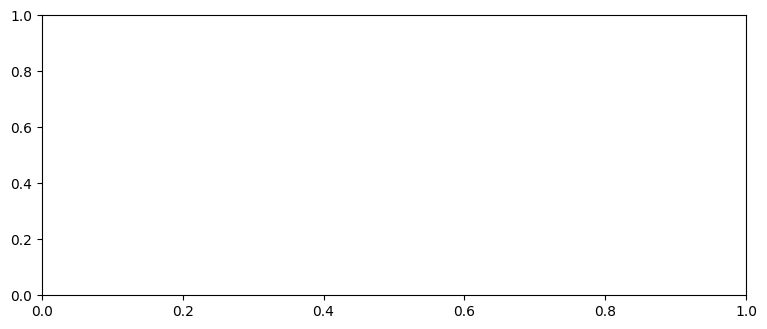

In [15]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 4*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=True
                                      )

plt.tight_layout()
plt.show()

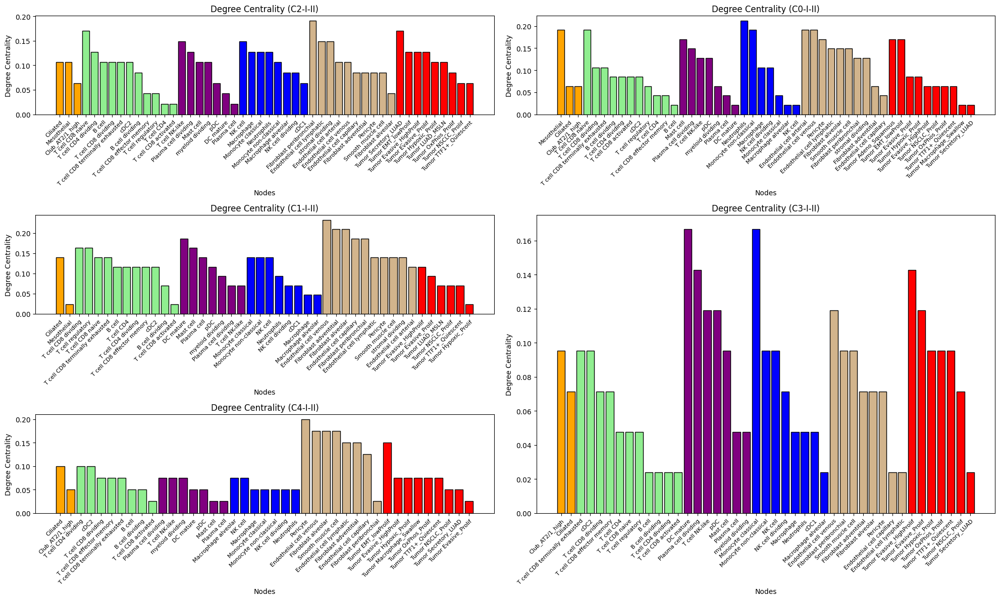

In [42]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 4*nrows))

for i, cluster_id in enumerate(unique_clusters):
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():
        subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=False
                                      )

plt.tight_layout()
plt.show()

### Export graphs

In [39]:
import pickle

for cluster_id, G in Gs.items():
    filename = f"{output_dir}/G_{time_solo}_{cluster_id}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(G, f)
print("Saved all graphs in Gs.")

Saved all graphs in Gs.


### Sankey Plot

In [24]:
use_gradients = False  # toggle Sankey ribbon gradients

In [ ]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from holoviews.core.dimension import Dimensioned
from IPython.display import display, Image

hv.extension('matplotlib')
idx = 0
G = Gs[idx]

# Generate the sankey plot
result = abundance.sankey(
    G,
    category_map,
    abundance.color_map,
    title=f'Sankey of {time_solo} Cluster',
    holo_kws={'fontsize': {'title': 18}},
    include_intra_self=True,
    gradients=use_gradients
 )

if isinstance(result, Dimensioned):
    fig = hv.render(result, backend='matplotlib')
else:
    fig = result

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [ ]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Ensure matplotlib backend to preserve custom rotated labels hook in abundance.sankey
hv.extension('matplotlib')

# Build deterministically so order is stable
sankeys = {
    cid: abundance.sankey(
        Gs[cid],
        category_map,
        abundance.color_map,
        title=f'Cluster {cid}',
        gradients=use_gradients
    )
    for cid in sorted(Gs)
}

# Create layout (grid) of Sankey plots
layout = hv.NdLayout(sankeys, kdims=['Cluster']).cols(2)

# Backend-specific sizing
layout = layout.opts(
    hv.opts.Sankey(fig_inches=0.8, aspect=0.95, fontsize={'title': 16}, show_frame=False),
    hv.opts.Layout(tight=True, hspace=0.0, vspace=0.0)
 )

fig = hv.render(layout, backend='matplotlib')

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [38]:
hv.save(layout, f'{output_dir}/sankey_{time_solo}.png')  # Save the layout as a PNG file

## III-IV Leiden Wu

Get the relative abundance of cell type per sample

In [101]:
time = 'III-IV_leidenwu_funcnames'
time_solo = time.split('_')[0]
time_suffix = 'early' if time_solo == 'I-II' else 'late'

# Unstack the group counts
groups = pd.read_csv(f'{meta_folder}/groups_{time}.csv', index_col=0)
groups.sort_values([cell_type_key, sample_key])
groups.set_index([cell_type_key,sample_key], inplace=True)
cutoff = groups.loc[:, '0']
# We dont remove the cutoff because it messes with the dims
cutoff = pd.DataFrame(cutoff[cutoff > 1])
samp_type = cutoff.unstack().transpose()

# Normalize the counts
samp_type = samp_type.fillna(0)
corr_types = (samp_type.T / samp_type.T.sum()).T

groups.reset_index(inplace=True)
group_dataset = groups.groupby(['sample','dataset']).sum()
group_dataset.reset_index(inplace=True)
corr_types = pd.merge(corr_types, group_dataset.loc[:,[sample_key,'dataset']], how='left', left_on=sample_key, right_on=sample_key)
corr_types.set_index(sample_key, inplace=True)


print(f'Size of Corr_types: {corr_types.shape}')

Size of Corr_types: (111, 52)


Import CLUSTERS  if they exist if not error

In [107]:
if not 'membership' in corr_types.columns:
    df_short = pd.read_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv', index_col=0)
    corr_types = pd.merge(corr_types, df_short['membership'], how='left', right_index=True, left_index=True)
else:
    print('Memberhsip column is already present, delete it if you want to reimport')

# This is important for all later visualizations
unique_clusters = corr_types["membership"].unique()

corr_types

,AT2,B cell,B cell dividing,Ciliated,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor NE_HPA,Tumor Plastic_AS_NE,Tumor ROS1+,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
BD_immune01,0.0,0.007598,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.002533,0.000000,...,0.009287,0.013930,0.000633,0.000000,0.000000,0.004854,0.000000,0.0,Hu,0
BD_immune02,0.0,0.352115,0.000374,0.002059,0.000000,0.0,0.0,0.000000,0.000374,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.004493,0.000936,0.000936,0.0,Hu,1
BD_immune03,0.0,0.086106,0.002485,0.000000,0.000756,0.0,0.0,0.000000,0.000432,0.000000,...,0.016746,0.035436,0.001188,0.000540,0.006158,0.000864,0.003349,0.0,Hu,1
BD_immune04,0.0,0.050995,0.000000,0.001549,0.000715,0.0,0.0,0.000000,0.000596,0.000000,...,0.000000,0.000000,0.000596,0.000000,0.008102,0.003694,0.002502,0.0,Hu,1
BD_immune05,0.0,0.062460,0.000966,0.000000,0.000644,0.0,0.0,0.000000,0.000966,0.000644,...,0.003220,0.001932,0.002254,0.000000,0.000966,0.004185,0.000000,0.0,Hu,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p7t1,0.0,0.021429,0.000000,0.000000,0.001648,0.0,0.0,0.000000,0.008791,0.000000,...,0.000000,0.001099,0.003297,0.000000,0.019780,0.001648,0.013187,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p7t2,0.0,0.020810,0.000000,0.000000,0.003375,0.0,0.0,0.000000,0.009561,0.000000,...,0.000000,0.001125,0.006749,0.001125,0.014623,0.001687,0.017435,0.0,Zilionis_Klein_2019,0
p019t,0.0,0.019305,0.000000,0.039897,0.000000,0.0,0.0,0.000000,0.009009,0.004505,...,0.002574,0.003861,0.172458,0.000000,0.010296,0.003218,0.001931,0.0,Bishoff,0


IMPORT GRAPHS IF EXIST

In [16]:
import pickle
import os

Gs_E = {}
for fname in os.listdir(output_dir):
    if fname.startswith(f"G_{time_solo}_") and fname.endswith(".pkl"):
        cluster_id = fname[len(f"G_{time_solo}_"):-4]
        with open(os.path.join(output_dir, fname), "rb") as f:
            Gs_E[int(cluster_id)] = pickle.load(f)

Gs = Gs_E
Gs

{5: <networkx.classes.graph.Graph at 0x7f47263b9450>,
 1: <networkx.classes.graph.Graph at 0x7f47266bfb90>,
 4: <networkx.classes.graph.Graph at 0x7f4727403bd0>,
 0: <networkx.classes.graph.Graph at 0x7f4727401f50>,
 3: <networkx.classes.graph.Graph at 0x7f4726176150>,
 2: <networkx.classes.graph.Graph at 0x7f4727559a90>}

### Box plot general

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:


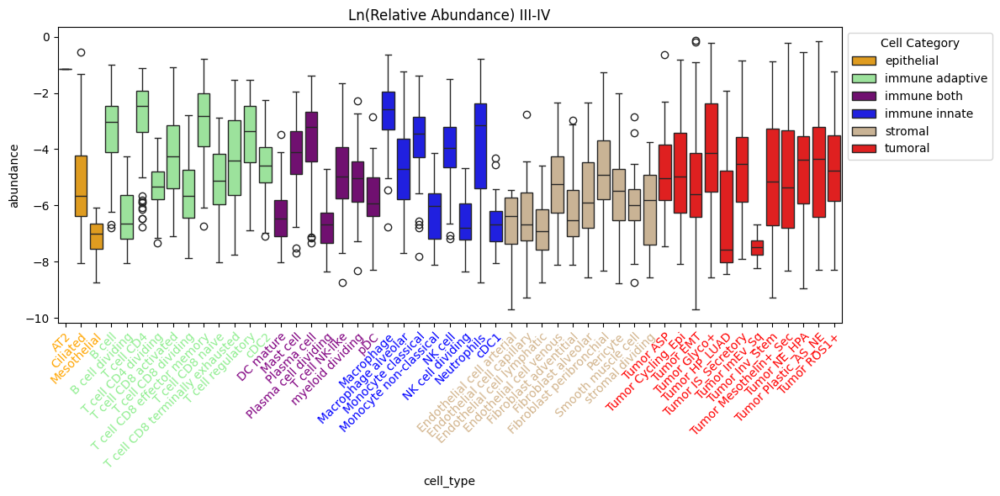

In [103]:
abundance.plot_celltype_boxplot(corr_types.drop(columns=['dataset',
                                                        #  'membership'
                                                         ]), time_solo,
    abundance.cell_category_mapping, abundance.color_map)
plt.show()

#### Immune

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

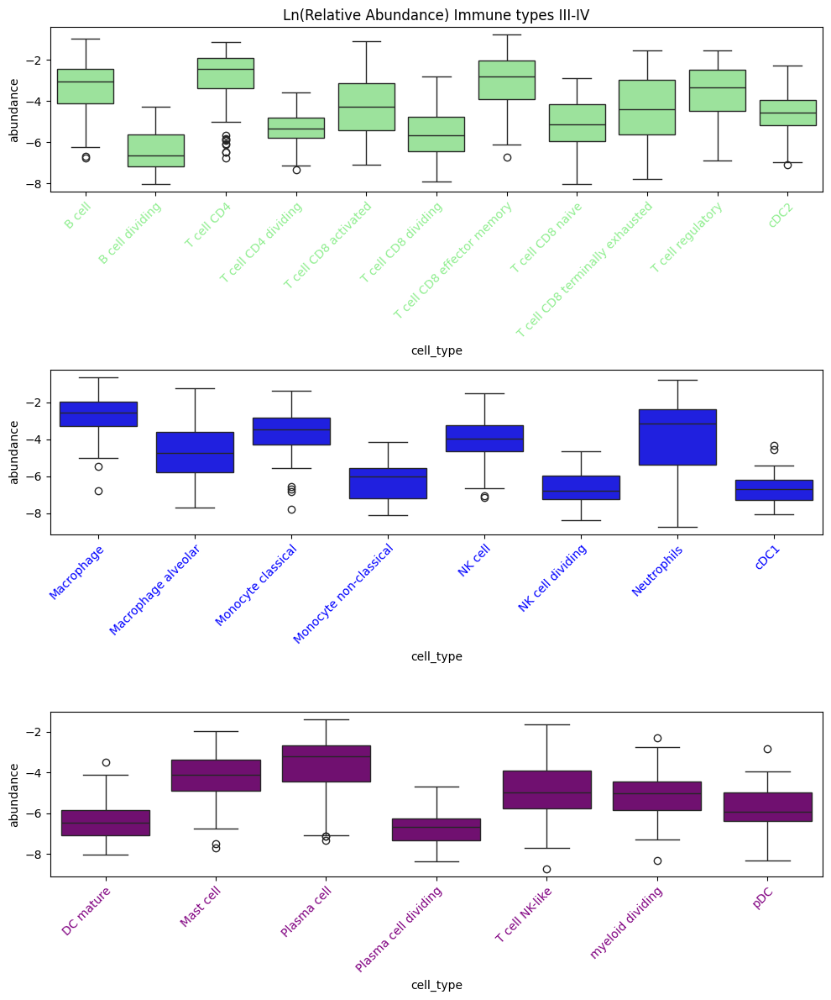

In [105]:
cats_of_interest = ['immune adaptive',
                     'immune innate', 'immune both'
                     ]

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    # ax.tick_params(axis='x', labelcolor='black')
    # ax.set_xticklabels([])
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

#### Stromal

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

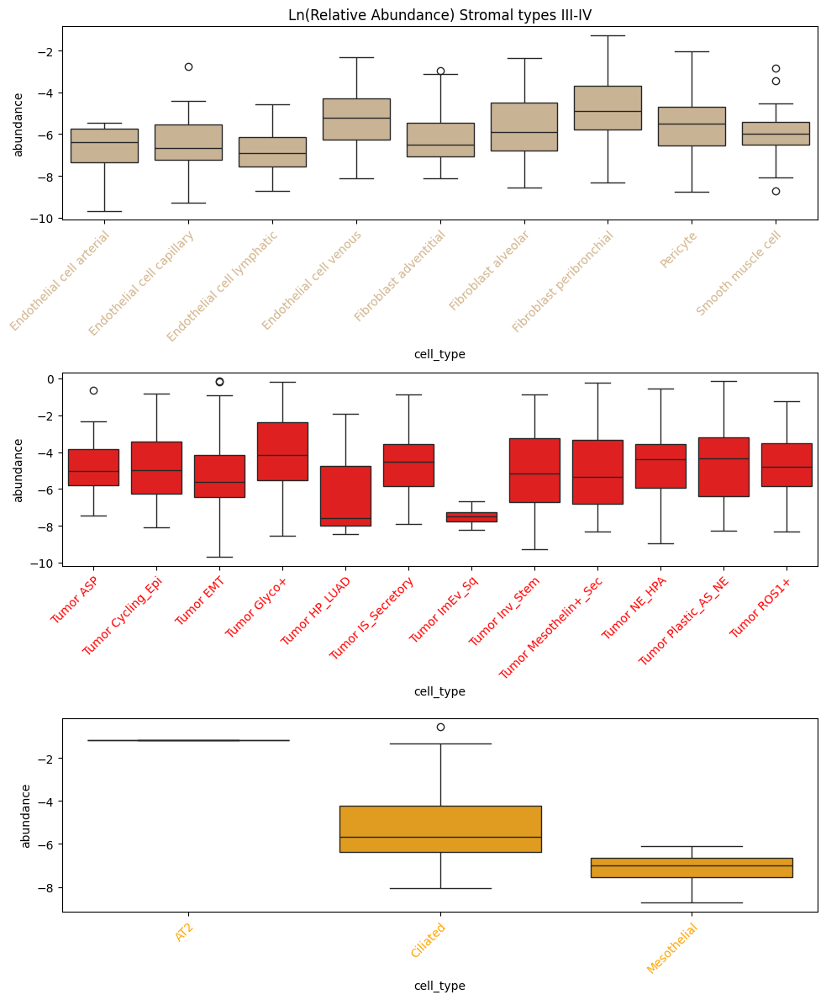

In [106]:
cats_of_interest = ['stromal', 'tumoral', 'epithelial']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Stromal types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

### Calculate clusters

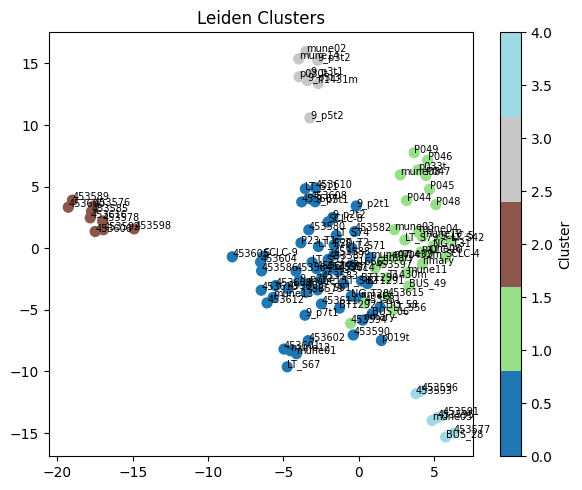

,dataset,membership
sample,,
BD_immune01,Hu,0
Wu_Zhou_2021_GSM4453599,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453590,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453588,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453587,Wu_Zhou_2021,0
...,...,...
Wu_Zhou_2021_GSM4453596,Wu_Zhou_2021,4
Wu_Zhou_2021_GSM4453595,Wu_Zhou_2021,4
Wu_Zhou_2021_GSM4453593,Wu_Zhou_2021,4


In [ ]:
g = abundance.cluster_samples_leiden(corr_types.drop(columns=['dataset',
                                                              'membership'
                                                              ]), k=4, res=0.3)

# Create a mapping from sample name to membership
membership_map = {v["name"]: v["membership"] for v in g.vs}

# Add the membership column to corr_types_III
corr_types["membership"] = corr_types.index.map(membership_map)
unique_clusters = corr_types["membership"].unique()
corr_types.head()

Merge clusters 1 and 3 because they both have low tumor cells high immune. And curisly the opposite for 2 and 4

In [ ]:
corr_types.loc[corr_types['membership']==3, 'membership'] = 1
corr_types.loc[corr_types['membership']==4, 'membership'] = 2
corr_types['membership'].unique()

array([0, 1, 2])

In [58]:
df_short = corr_types[['dataset', 'membership']].sort_values('membership')
df_short.to_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv')
df_short

,dataset,membership
sample,,
BD_immune01,Hu,0
Wu_Zhou_2021_GSM4453599,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453590,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453588,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453587,Wu_Zhou_2021,0
...,...,...
Wu_Zhou_2021_GSM4453592,Wu_Zhou_2021,2
Wu_Zhou_2021_GSM4453598,Wu_Zhou_2021,2
Wu_Zhou_2021_GSM4453593,Wu_Zhou_2021,2


### Abundance Heatmap

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


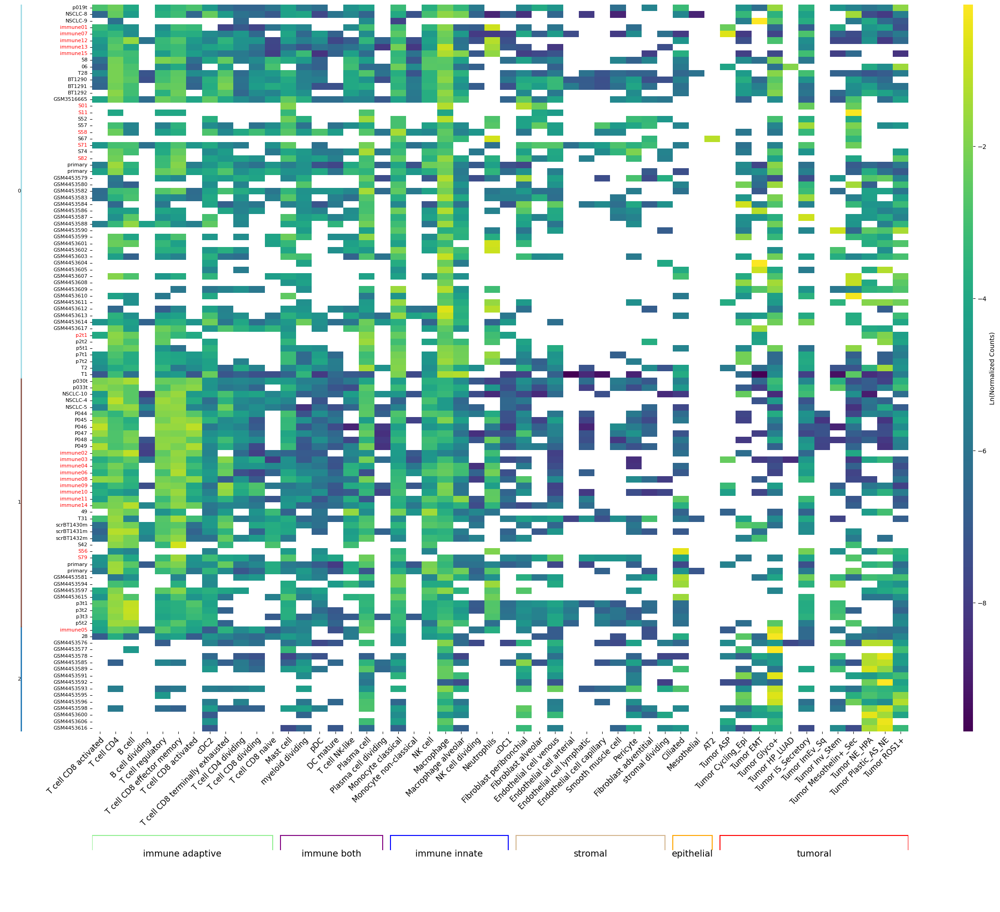

In [ ]:
a = abundance.plot_abundance_heatmap(corr_types, show_plot=False, group_by_membership=True)
# a = abundance.plot_abundance_heatmap(corr_types.drop(columns='membership'), show_plot=False, group_by_membership=True)

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


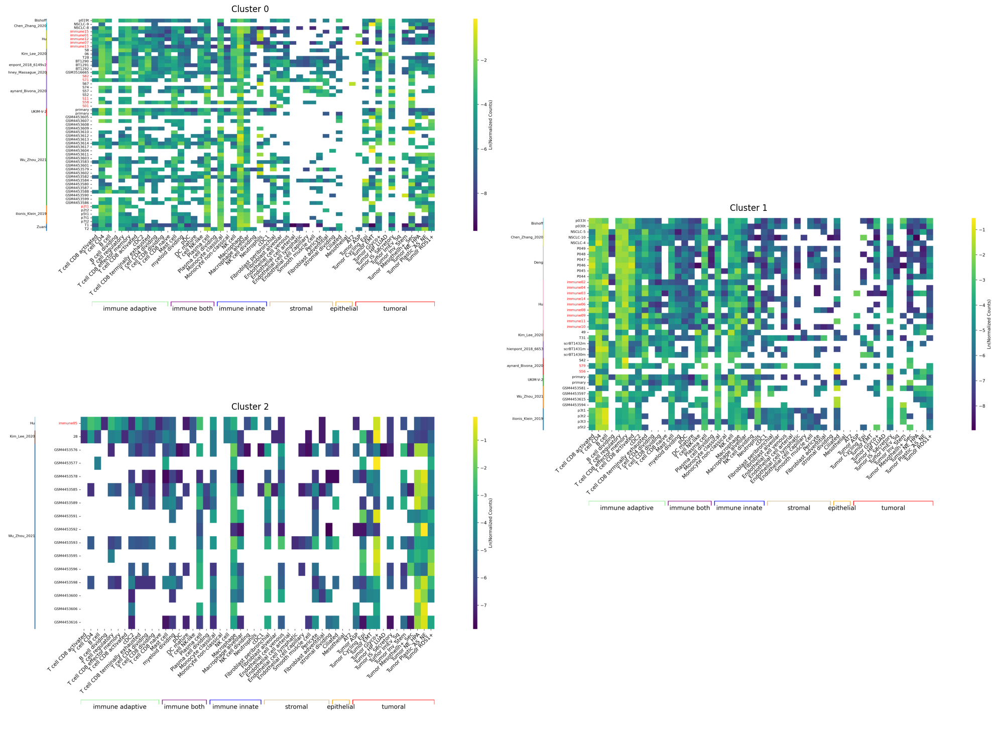

In [110]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Initialize main figure and grid
unique_clusters = sorted(c for c in corr_types["membership"].unique() if pd.notna(c))
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 8 * nrows))  # Main figure

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    if subset.empty:
        continue

    # Generate heatmap figure with lighter footprint
    temp_fig = abundance.plot_abundance_heatmap(
        subset,
        show_plot=False,
        figsize=(16, 10),
    )

    buf = io.BytesIO()
    temp_fig.savefig(buf, format="png", bbox_inches="tight", dpi=200)
    plt.close(temp_fig)  # Close temporary figure early to free memory

    buf.seek(0)
    with Image.open(buf) as img:
        img_array = np.array(img)
    buf.close()

    # Switch back to main figure explicitly
    plt.figure(fig.number)

    # Add subplot to main figure
    rs = 2 if (is_unpair and i == len(unique_clusters) - 2) else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)
    ax.imshow(img_array)
    ax.axis("off")  # Hide main figure's axes (use image's baked-in axes)
    ax.set_title(f"Cluster {cluster_id}")

plt.tight_layout()
plt.show()

### Cluster boxplots

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

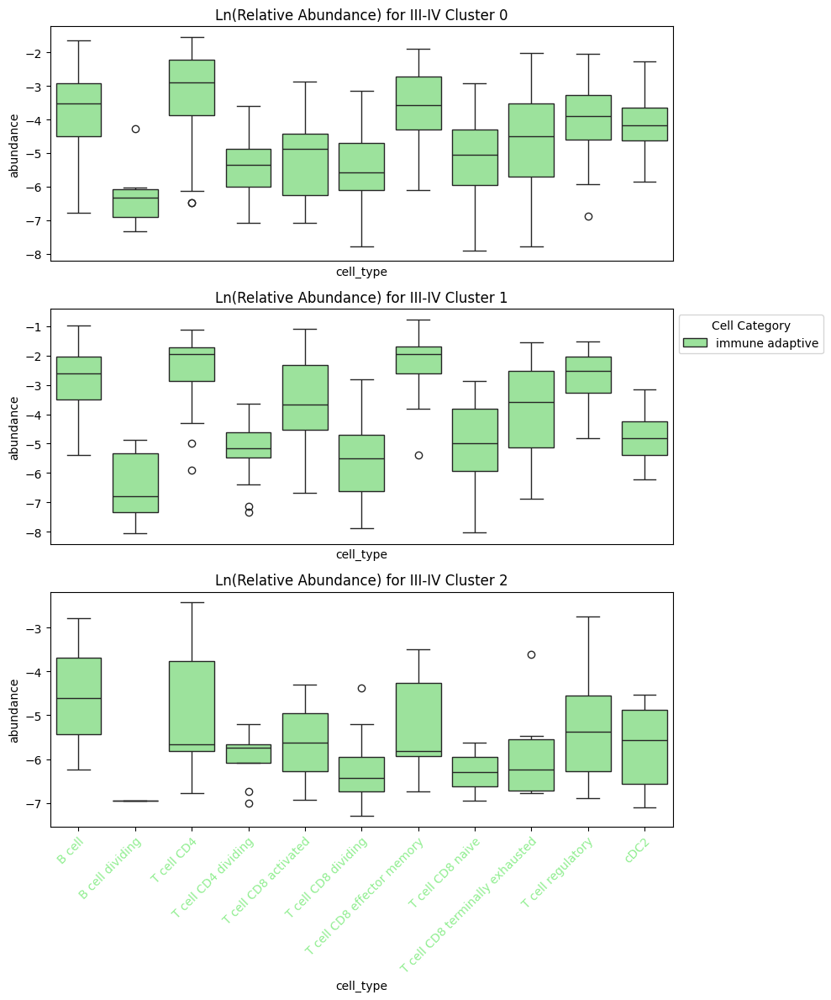

In [111]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(10, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if category_map(col) == 'immune adaptive' ]
    subset = subset[cols]    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset, title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax,
                                     xlabel_color='black')
    
    if i != 1:
        ax.get_legend().remove()

    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])


plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

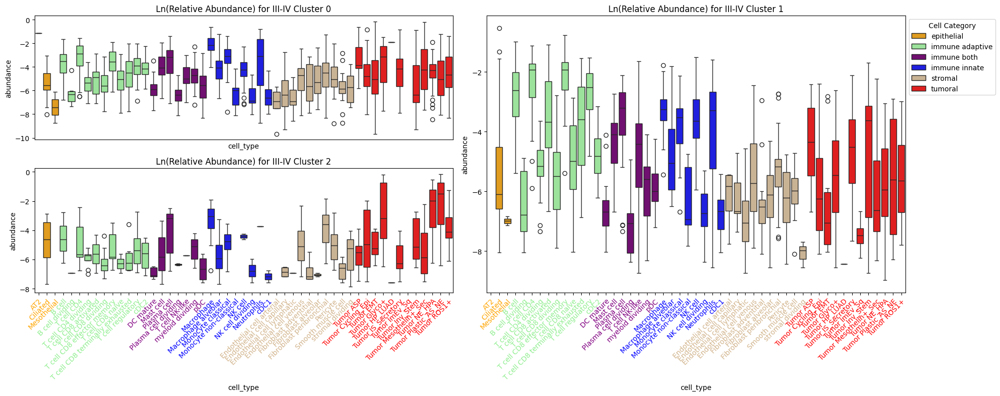

In [112]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
nrows2 = nrows -1 if is_unpair else nrows
fig = plt.figure(figsize=(20, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset.drop(columns=['dataset']),title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax)
    
    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])        
        
    if i != 1:
        ax.get_legend().remove()


plt.tight_layout()
plt.show()

### Coabundance GRAPHS

In [23]:
Gs = {}

/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])
/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])
/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])
/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])


/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])
/root/host_home/luca/utils/abundance.py:303: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])


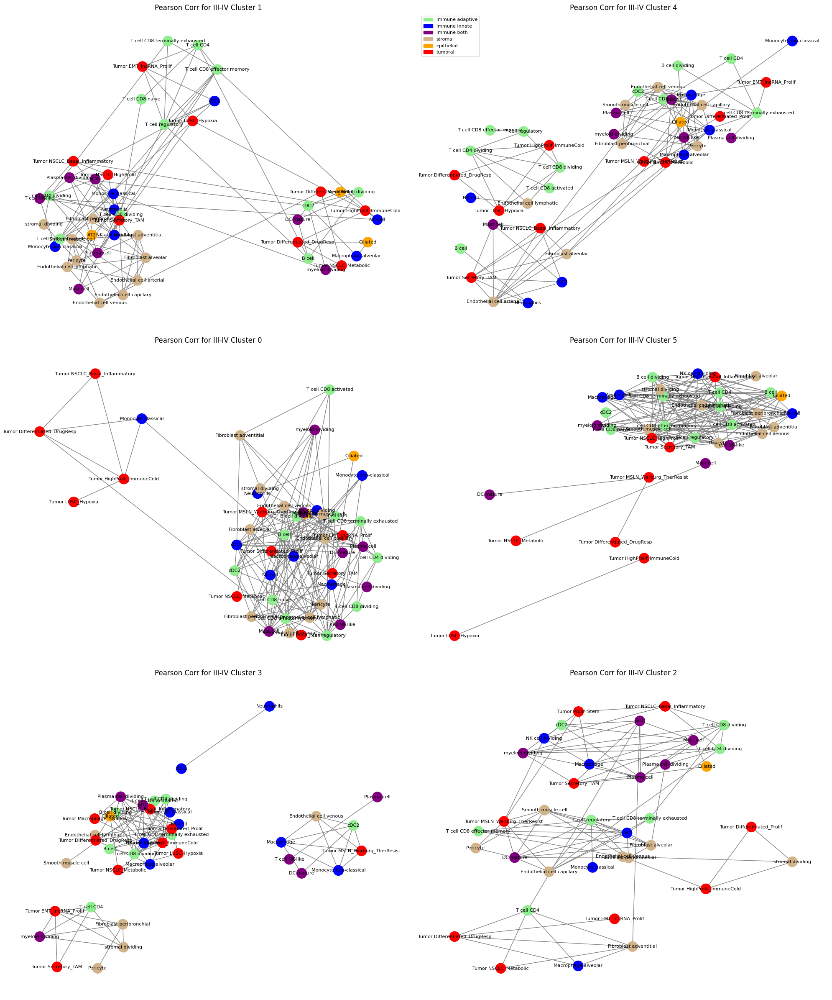

In [24]:
unique_clusters = corr_types["membership"].unique()
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(20, 8*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id]#.drop(columns="membership")

    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    
    abundance.draw_graph(G, ax, f'Pearson Corr for {time_solo} Cluster {cluster_id}', scale2=7)
    ax.axis('off')
    if i != 1:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


### dEGREE CENTRAL

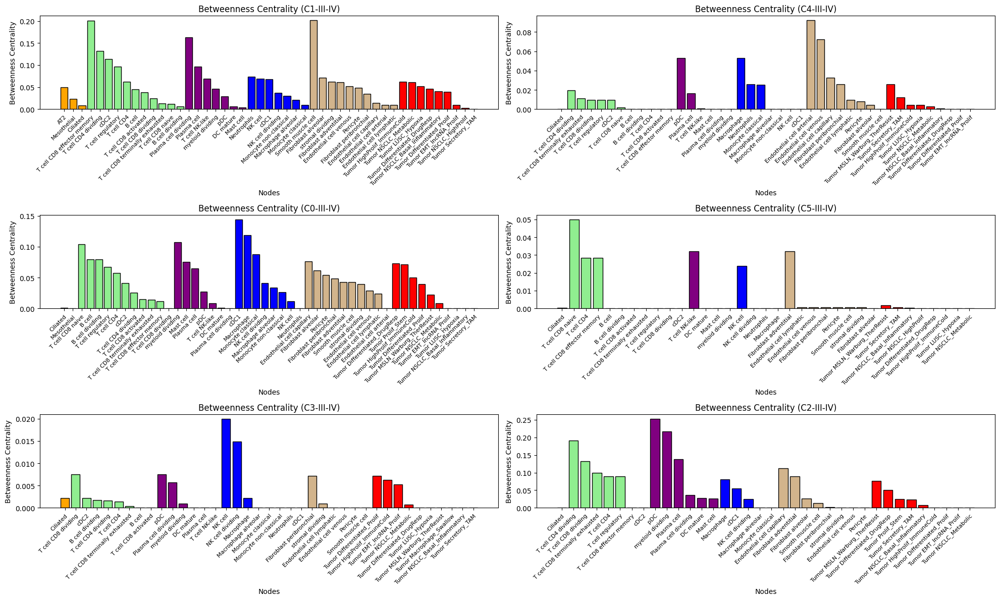

In [25]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 4*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=True
                                      )

plt.tight_layout()
plt.show()

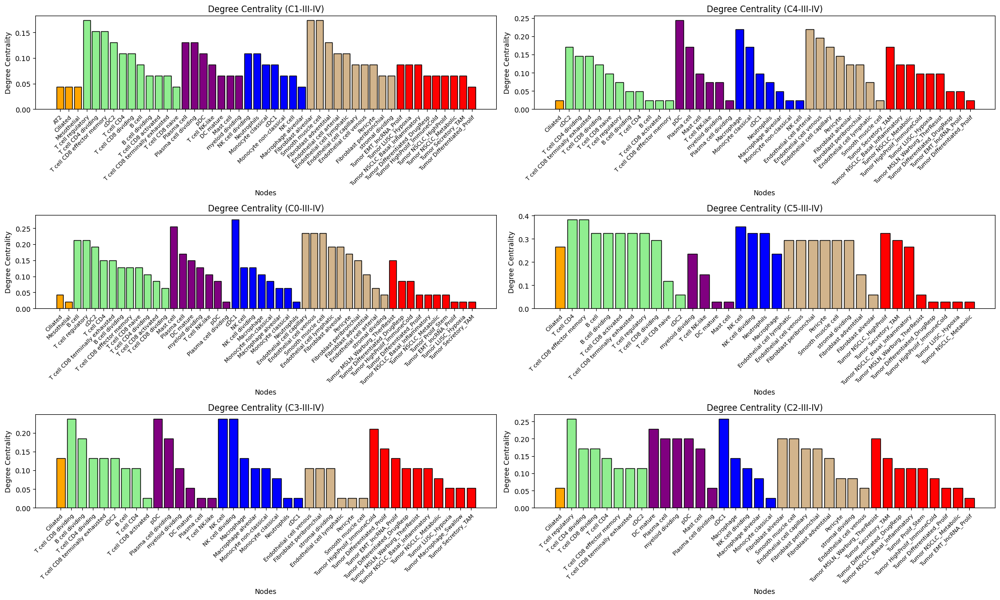

In [26]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 4*nrows))

for i, cluster_id in enumerate(unique_clusters):
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():
        subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=False
                                      )

plt.tight_layout()
plt.show()

### Export graphs

In [ ]:
import pickle

for cluster_id, G in Gs.items():
    filename = f"{output_dir}/G_{time_solo}_{cluster_id}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(G, f)
print("Saved all graphs in Gs.")

Saved all graphs in Gs.


### Sankey Plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

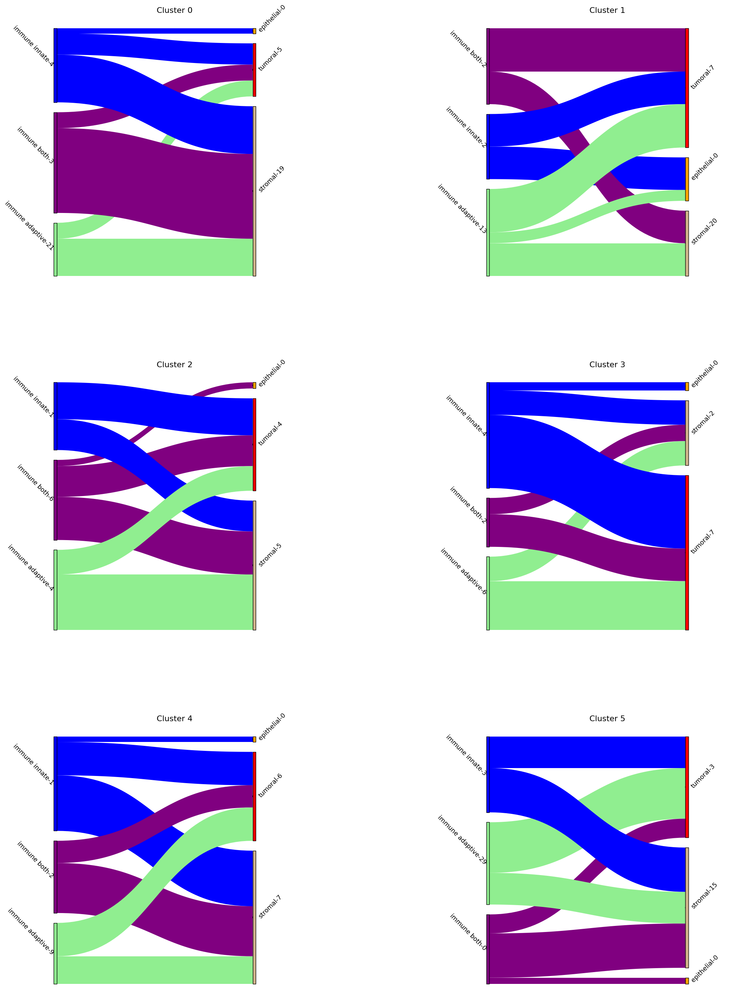

In [32]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Ensure matplotlib backend to preserve custom rotated labels hook in abundance.sankey
hv.extension('matplotlib')

use_gradients = False  # toggle Sankey ribbon gradients

# Build deterministically so order is stable
sankeys = {
    cid: abundance.sankey(
        Gs[cid],
        category_map,
        abundance.color_map,
        title=f'Cluster {cid}',
        gradients=use_gradients
    )
    for cid in sorted(Gs)
}

# Create layout (grid) of Sankey plots
layout = hv.NdLayout(sankeys, kdims=['Cluster']).cols(2)

# Backend-specific sizing
layout = layout.opts(
    hv.opts.Sankey(fig_inches=0.8, aspect=0.95, fontsize={'title': 16}, show_frame=False),
    hv.opts.Layout(tight=True, hspace=0.0, vspace=0.0)
 )

fig = hv.render(layout, backend='matplotlib')

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [33]:
hv.save(layout, f'{output_dir}/sankey_{time_solo}.png')  # Save the layout as a PNG file